In [1]:
!pip install rasterio
!pip install geopandas 
!pip install shapely
!pip install wandb

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.0/20.0 MB 23.9 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 32.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.5/16.5 MB 19.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.7/7.7 MB 32.1 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 62.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 20.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 205.1/205.1 kB 23.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  

In [2]:
!pip install awscli boto3

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.1/4.1 MB 87.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.6/135.6 kB 16.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.7/10.7 MB 114.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.8/79.8 kB 10.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 175.1/175.1 kB 21.1 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for PyYAML: filename=PyYAML-5.4.1-cp310-cp310-linux_x86_64.whl size=45658 sha256=391d8fd5908b66b72fa504ee07c21bbc3bd592c3758a186e54e50d89680f13b2
  Stored in directory: /root/.cache/pip/wheels/c7/0d/22/696ee92245ad710f506eee79bb05c740d8abccd3ecdb778683
Successfully built PyYAML
  Attempting uninstall: rsa
    Found existing installation: rsa 4.9

In [3]:
import configparser
import os

# Load the AWS credentials file
config = configparser.ConfigParser()
config.read('/content/aws_credentials.ini')

# Set the AWS credentials as environment variables
os.environ['AWS_ACCESS_KEY_ID'] = config.get('default', 'aws_access_key_id')
os.environ['AWS_SECRET_ACCESS_KEY'] = config.get('default', 'aws_secret_access_key')
# Set the AWS region and output format as environment variables
os.environ['AWS_DEFAULT_REGION'] = config.get('default', 'region')
os.environ['AWS_DEFAULT_OUTPUT'] = config.get('default', 'output')


In [4]:
!mkdir spacenet7
!aws s3 sync --no-sign-request --quiet s3://spacenet-dataset/spacenet/SN7_buildings/ spacenet7

In [5]:
!tar -xzf /content/spacenet7/tarballs/SN7_buildings_train_sample.tar.gz

In [6]:
from fastai.vision.all import *
from tqdm import tqdm
from pdb import set_trace
from pprint import pprint

import wandb
from fastai.callback.wandb import *

warnings.filterwarnings("ignore")

path = Path('/content/spacenet7/train')
Path.BASE_PATH = path

Defining training parameters:

In [7]:
BATCH_SIZE = 12 # 3 for xresnet50, 12 for xresnet34 with Tesla P100 (16GB)
TILES_PER_SCENE = 16
ARCHITECTURE = xresnet34
EPOCHS = 40
CLASS_WEIGHTS = [0.25,0.75]
LR_MAX = 3e-4
ENCODER_FACTOR = 10
CODES = ['Land','Building']

In [8]:
# Weights and Biases config
config_dictionary = dict(
    bs=BATCH_SIZE,
    tiles_per_scene=TILES_PER_SCENE,
    architecture = str(ARCHITECTURE),
    epochs = EPOCHS,
    class_weights = CLASS_WEIGHTS,
    lr_max = LR_MAX,
    encoder_factor = ENCODER_FACTOR
)

## Preprocessing

In [10]:
sample_scene = (path/'L15-0331E-1257N_1327_3160_13')

In [12]:
images_masked = (sample_scene/'images_masked').ls().sorted()
labels = (sample_scene/'labels_match').ls().sorted()



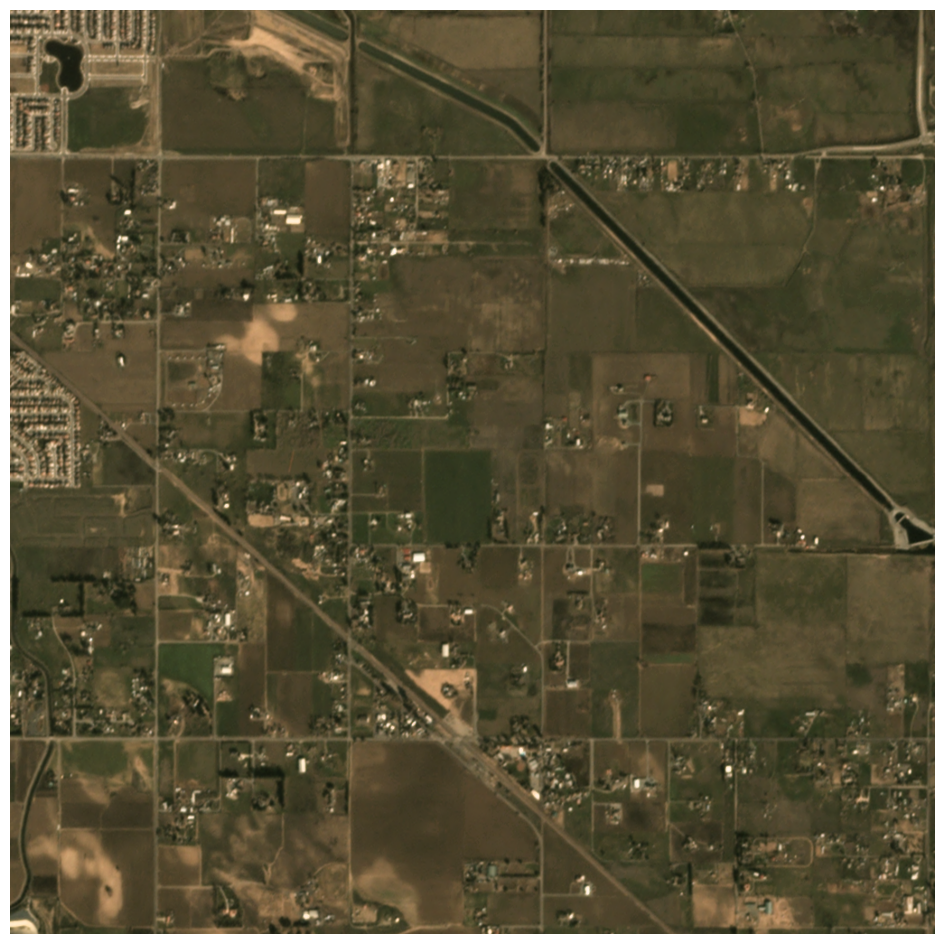

In [15]:
image, shapes = images_masked[0], labels[0]
show_image(PILImage.create(image), figsize=(12,12));

### Creating binary masks

In [17]:
import rasterio
from rasterio.plot import reshape_as_image
import rasterio.mask
from rasterio.features import rasterize

import pandas as pd
import geopandas as gpd
from shapely.geometry import mapping, Point, Polygon
from shapely.ops import cascaded_union

def generate_mask(raster_path, shape_path, output_path=None, file_name=None):
    #load raster
    with rasterio.open(raster_path, "r") as src:
        raster_img = src.read()
        raster_meta = src.meta
    
    #load o shapefile ou GeoJson
    train_df = gpd.read_file(shape_path)
    
    #Verify crs
    if train_df.crs != src.crs:
        print(" Raster crs : {}, Vector crs : {}.\n Convert vector and raster to the same CRS.".format(src.crs,train_df.crs))
        
        
    #Function that generates the mask
    def poly_from_utm(polygon, transform):
        poly_pts = []

        poly = cascaded_union(polygon)
        for i in np.array(poly.exterior.coords):

            poly_pts.append(~transform * tuple(i))

        new_poly = Polygon(poly_pts)
        return new_poly
    
    
    poly_shp = []
    im_size = (src.meta['height'], src.meta['width'])
    for num, row in train_df.iterrows():
        if row['geometry'].geom_type == 'Polygon':
            poly = poly_from_utm(row['geometry'], src.meta['transform'])
            poly_shp.append(poly)
        else:
            for p in row['geometry']:
                poly = poly_from_utm(p, src.meta['transform'])
                poly_shp.append(poly)

    #set_trace()
    if len(poly_shp) > 0:
      mask = rasterize(shapes=poly_shp,
                      out_shape=im_size)
    else:
      mask = np.zeros(im_size)
    
    # Save or show mask
    mask = mask.astype("uint8")    
    bin_mask_meta = src.meta.copy()
    bin_mask_meta.update({'count': 1})
    if (output_path != None and file_name != None):
      os.chdir(output_path)
      with rasterio.open(file_name, 'w', **bin_mask_meta) as dst:
          dst.write(mask * 255, 1)
    else: 
      return mask

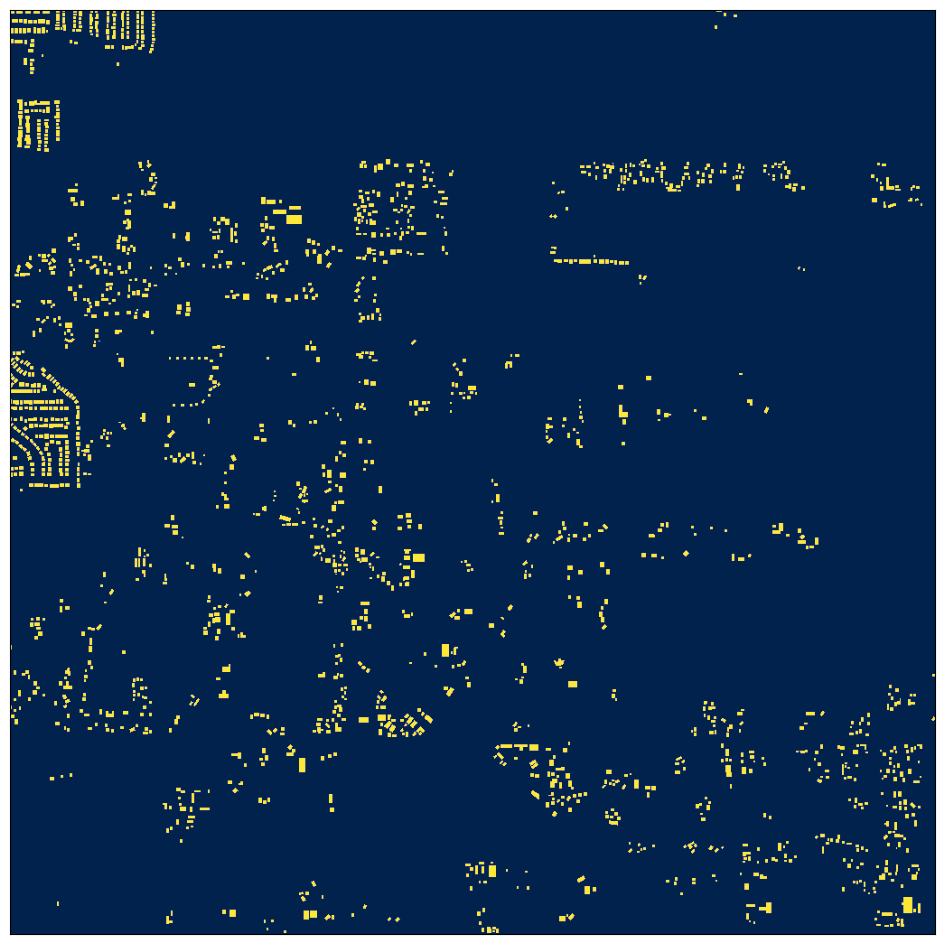

In [18]:
#collapse
mask = generate_mask(image, shapes)
plt.figure(figsize=(12,12))
plt.tight_layout()
plt.xticks([])
plt.yticks([])
plt.imshow(mask,cmap='cividis');

In [19]:
def save_masks():
  for scene in tqdm(path.ls().sorted()):
    for img in (scene/'images_masked').ls():
      try:
        shapes = scene/'labels_match'/(img.name[:-4]+'_Buildings.geojson')
        if not os.path.exists(scene/'binary_mask'/img.name):
          if not os.path.exists(scene/'binary_mask'):
            os.makedirs(scene/'binary_mask')
          generate_mask(img, shapes, scene/'binary_mask', img.name)
      except Exception as e:
        print(f"Error with image {img}: {e}")


In [20]:
save_masks()

 12%|█▏        | 7/60 [06:16<37:25, 42.37s/it]

 Raster crs : EPSG:3857, Vector crs : EPSG:4326.
 Convert vector and raster to the same CRS.
 Raster crs : EPSG:3857, Vector crs : EPSG:4326.
 Convert vector and raster to the same CRS.
 Raster crs : EPSG:3857, Vector crs : EPSG:4326.
 Convert vector and raster to the same CRS.
 Raster crs : EPSG:3857, Vector crs : EPSG:4326.
 Convert vector and raster to the same CRS.


 95%|█████████▌| 57/60 [58:49<03:02, 60.80s/it]

Error with image /content/spacenet7/train/L15-1716E-1211N_6864_3345_13/images_masked/global_monthly_2020_01_mosaic_L15-1716E-1211N_6864_3345_13.tif: can't multiply sequence by non-int of type 'Affine'


 98%|█████████▊| 59/60 [1:00:42<00:54, 54.26s/it]

 Raster crs : EPSG:3857, Vector crs : EPSG:4326.
 Convert vector and raster to the same CRS.
 Raster crs : EPSG:3857, Vector crs : EPSG:4326.
 Convert vector and raster to the same CRS.
 Raster crs : EPSG:3857, Vector crs : EPSG:4326.
 Convert vector and raster to the same CRS.
 Raster crs : EPSG:3857, Vector crs : EPSG:4326.
 Convert vector and raster to the same CRS.
 Raster crs : EPSG:3857, Vector crs : EPSG:4326.
 Convert vector and raster to the same CRS.
 Raster crs : EPSG:3857, Vector crs : EPSG:4326.
 Convert vector and raster to the same CRS.
 Raster crs : EPSG:3857, Vector crs : EPSG:4326.
 Convert vector and raster to the same CRS.
 Raster crs : EPSG:3857, Vector crs : EPSG:4326.
 Convert vector and raster to the same CRS.
 Raster crs : EPSG:3857, Vector crs : EPSG:4326.
 Convert vector and raster to the same CRS.
 Raster crs : EPSG:3857, Vector crs : EPSG:4326.
 Convert vector and raster to the same CRS.
 Raster crs : EPSG:3857, Vector crs : EPSG:4326.
 Convert vector and r

100%|██████████| 60/60 [1:00:49<00:00, 60.83s/it]


In [21]:
def get_masked_images(path:Path, n=1)->list:
  "Returns the first `n` pictures from every scene"
  files = []
  for folder in path.ls():
    files.extend(get_image_files(path=folder, folders='images_masked')[:n])
  return files

In [22]:
masked_images = get_masked_images(path, 1)

In [23]:
import os
import numpy as np
from PIL import Image
from tqdm import tqdm
from fastai.vision.all import PILImage, PILMask

def cut_tiles(tile_size: int):
    "Cuts the large images and masks into equal tiles and saves them to disk"
    masked_images = get_masked_images(path, 5)
    for fn in tqdm(masked_images):
        scene = fn.parent.parent

        # Create directories
        if not os.path.exists(scene/'img_tiles'):
            os.makedirs(scene/'img_tiles')
        if not os.path.exists(scene/'mask_tiles'):
            os.makedirs(scene/'mask_tiles')

        # Create mask for current image
        img = np.array(PILImage.create(fn))
        msk_fn = str(fn).replace('images_masked', 'binary_mask')
        
        try:
            msk = np.array(PILMask.create(msk_fn))
        except FileNotFoundError:
            print(f"File not found: {msk_fn}. Skipping...")
            continue

        x, y, _ = img.shape

        # Cut tiles and save them
        for i in range(x // tile_size):
            for j in range(y // tile_size):
                img_tile = img[i * tile_size:(i + 1) * tile_size, j * tile_size:(j + 1) * tile_size]
                msk_tile = msk[i * tile_size:(i + 1) * tile_size, j * tile_size:(j + 1) * tile_size]
                Image.fromarray(img_tile).save(f'{scene}/img_tiles/{fn.name[:-4]}_{i}_{j}.png')
                Image.fromarray(msk_tile).save(f'{scene}/mask_tiles/{fn.name[:-4]}_{i}_{j}.png')


In [24]:
TILE_SIZE = 255
cut_tiles(TILE_SIZE)

100%|██████████| 300/300 [02:50<00:00,  1.76it/s]


In [25]:
def get_image_tiles(path:Path, n_tiles=TILES_PER_SCENE) -> L:
  "Returns a list of the first `n` image tile filenames in `path`"
  files = L()
  for folder in path.ls():
    files.extend(get_image_files(path=folder, folders='img_tiles')[:n_tiles])
  return files

In [26]:
def get_y_fn(fn:Path) -> str:
  "Returns filename of the associated mask tile for a given image tile"
  return str(fn).replace('img_tiles', 'mask_tiles')

In [27]:
def get_y(fn:Path) -> PILMask:
  "Returns a PILMask object of 0s and 1s for a given tile"
  fn = get_y_fn(fn)
  msk = np.array(PILMask.create(fn))
  msk[msk==255] = 1
  return PILMask.create(msk)

In [29]:
def show_tiles(n):
  all_tiles = get_image_tiles(path)
  subset = random.sample(all_tiles, n)
  fig, ax = plt.subplots(n//2, 4, figsize=(14,14))
  for i in range(n):
    y = i//2
    x = 2*i%4
    PILImage.create(subset[i]).show(ctx=ax[y, x])
    get_y(subset[i]).show(ctx=ax[y, x+1], cmap='cividis')
  fig.tight_layout()
  plt.show()

In [30]:
tiles = DataBlock(
      blocks = (ImageBlock(),MaskBlock(codes=CODES)),
      get_items = get_image_tiles,
      get_y = get_y
    )              
dls = tiles.dataloaders(path, bs=BATCH_SIZE)
dls.vocab = CODES                 

In [31]:
targs = torch.zeros((0,255,255))
for _, masks in dls[0]:
  targs = torch.cat((targs, masks.cpu()), dim=0)
targs.shape

torch.Size([768, 255, 255])

In [35]:
VALID_SCENES = ['L15-0571E-1075N_2287_3888_13',
 'L15-1615E-1205N_6460_3370_13',
 'L15-1210E-1025N_4840_4088_13',
 'L15-1185E-0935N_4742_4450_13',
 'L15-1481E-1119N_5927_3715_13',
 'L15-0632E-0892N_2528_4620_13',
 'L15-1438E-1134N_5753_3655_13',
 'L15-0924E-1108N_3699_3757_13',
 'L15-0457E-1135N_1831_3648_13']

In [36]:
def valid_split(item):
  scene = item.parent.parent.name
  return scene in VALID_SCENES

In [37]:
def has_buildings(fn:Path) -> bool:
  """Returns whether the mask of a given image tile
  contains at least one pixel of a building"""
  fn = get_y_fn(fn)
  msk = tensor(PILMask.create(fn))
  count = torch.count_nonzero(msk)
  return count>0.

In [38]:
def get_undersampled_tiles(path:Path) -> L:
  """Returns a list of image tile filenames in `path`.
  For tiles in the training set, empty tiles are ignored.
  All tiles in the validation set are included."""

  files = get_image_tiles(path)
  train_idxs, valid_idxs = FuncSplitter(valid_split)(files)
  train_files = L(filter(has_buildings, files[train_idxs]))
  valid_files = files[valid_idxs]

  return train_files + valid_files

In [39]:
tfms = [Dihedral(0.5),              # Horizontal and vertical flip
        Rotate(max_deg=180, p=0.9), # Rotation in any direction possible
        Brightness(0.2, p=0.75),
        Contrast(0.2),
        Saturation(0.2),
        Normalize.from_stats(*imagenet_stats)]

In [40]:
tiles = DataBlock(
      blocks = (ImageBlock(),MaskBlock(codes=CODES)), # Independent variable is Image, dependent variable is Mask
      get_items = get_undersampled_tiles,             # Collect undersampled tiles
      get_y = get_y,                                  # Get dependent variable: mask
      splitter = FuncSplitter(valid_split),           # Split into training and validation set
      batch_tfms = tfms                               # Transforms on GPU: augmentation, normalization
    )                              

In [41]:
dls = tiles.dataloaders(path, bs=BATCH_SIZE)
dls.vocab = CODES

In [42]:
len(dls.train_ds), len(dls.valid_ds)

(747, 144)

We have 747 tiles in the training set and 144 tiles in the validation set.

Making sure the batches look okay:

In [43]:
inputs, targets = dls.one_batch()

In [46]:
weights = Tensor(CLASS_WEIGHTS).cuda()
loss_func = CrossEntropyLossFlat(axis=1, weight=weights)

In [47]:
learn = unet_learner(dls,                                 # DataLoaders
                     ARCHITECTURE,                        # xResNet34
                     loss_func = loss_func,               # Weighted cross entropy loss
                     opt_func = Adam,                     # Adam optimizer
                     metrics = [Dice(), foreground_acc],  # Custom metrics
                     self_attention = False,
                     cbs = [SaveModelCallback(
                              monitor='dice',
                              comp=np.greater,
                              fname='best-model'
                            )]
                     )

Downloading: "https://s3.amazonaws.com/fast-ai-modelzoo/xrn50_940.pth" to /root/.cache/torch/hub/checkpoints/xrn50_940.pth
100%|██████████| 244M/244M [00:20<00:00, 12.7MB/s]


In [48]:
learn.summary()

DynamicUnet (Input shape: 12 x 3 x 255 x 255)
Layer (type)         Output Shape         Param #    Trainable 
                     12 x 32 x 128 x 128 
Conv2d                                    864        False     
BatchNorm2d                               64         True      
ReLU                                                           
Conv2d                                    9216       False     
BatchNorm2d                               64         True      
ReLU                                                           
____________________________________________________________________________
                     12 x 64 x 128 x 128 
Conv2d                                    18432      False     
BatchNorm2d                               128        True      
ReLU                                                           
____________________________________________________________________________
                     12 x 64 x 64 x 64   
MaxPool2d                         

In [49]:
learn.model

DynamicUnet(
  (layers): ModuleList(
    (0): Sequential(
      (0): ConvLayer(
        (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU()
      )
      (1): ConvLayer(
        (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU()
      )
      (2): ConvLayer(
        (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU()
      )
      (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (4): Sequential(
        (0): ResBlock(
          (convpath): Sequential(
            (0): ConvLayer(
              (0): Conv2d(64, 64, kernel_size=(

SuggestedLRs(valley=7.585775892948732e-05)

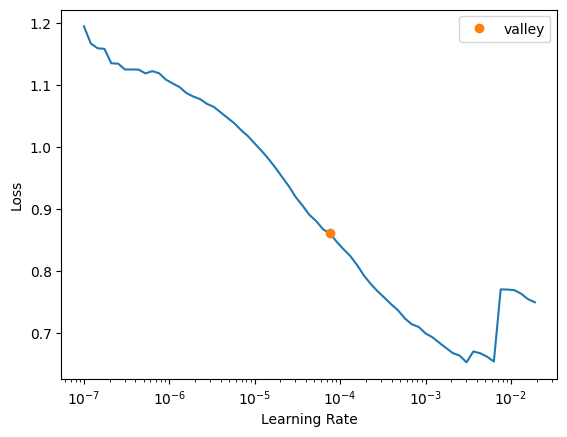

In [50]:
learn.lr_find()

In [51]:
lr_max = LR_MAX # 3e-4

Somewhere around 1e-4 seems reasonable, where the loss decreases steadily.

In [ ]:
wandb.init(project="dl_obj", entity="yaminaik917", config=config_dictionary)

<IPython.core.display.Javascript object>

In [ ]:
#hide
#learn.unfreeze()
#learn.fit_flat_cos(EPOCHS, lr=slice(lr_max/ENCODER_FACTOR, lr_max), wd=WEIGHT_DECAY, cbs=[WandbCallback()])

In [ ]:
#collapse-output
learn.unfreeze()
learn.fit_one_cycle(
    EPOCHS,
    lr_max=slice(lr_max/ENCODER_FACTOR, lr_max),
    cbs=[WandbCallback()]
)

epoch,train_loss,valid_loss,dice,foreground_acc,time
0,0.404860,0.398518,0.272620,0.198581,00:43
1,0.370387,0.364988,0.418141,0.433954,00:45
2,0.350420,0.332094,0.466836,0.500462,00:45
3,0.333788,0.352622,0.420421,0.348120,00:44
4,0.321968,0.352808,0.468778,0.471579,00:44
5,0.319575,0.330865,0.482259,0.671936,00:44
6,0.321750,0.324249,0.496640,0.608572,00:44
7,0.314132,0.320183,0.485234,0.457416,00:44
8,0.306817,0.320697,0.478045,0.426950,00:45
9,0.297017,0.315569,0.508352,0.541224,00:44


Better model found at epoch 0 with dice value: 0.2726195451280211.
Better model found at epoch 1 with dice value: 0.418140866724756.
Better model found at epoch 2 with dice value: 0.46683647181516885.
Better model found at epoch 4 with dice value: 0.468778418688751.
Better model found at epoch 5 with dice value: 0.482258796888729.
Better model found at epoch 6 with dice value: 0.4966399055971167.
Better model found at epoch 9 with dice value: 0.5083522636581396.
Better model found at epoch 11 with dice value: 0.5088525203101505.
Better model found at epoch 13 with dice value: 0.5227746724999071.
Better model found at epoch 19 with dice value: 0.5231473880360039.
Better model found at epoch 23 with dice value: 0.5255393070338903.
Better model found at epoch 24 with dice value: 0.5294640277415638.
Better model found at epoch 26 with dice value: 0.5301597394194945.
Better model found at epoch 27 with dice value: 0.5315044863890428.
Better model found at epoch 28 with dice value: 0.5315881

The best model at epoch 29 has a Dice score of `0.539882`. 


In [ ]:
#hide
wandb.finish()

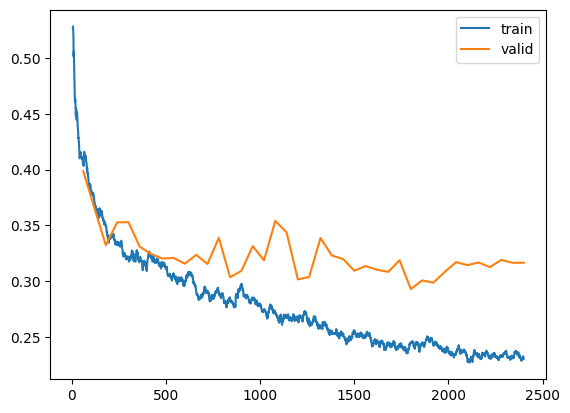

In [ ]:
learn.recorder.plot_loss()

In [ ]:
learn.load('best-model');

In [ ]:
#hide
#learn.save(path/'xresnet34-dice-575')

In [ ]:
#hide
#learn.load(path/'xresnet34-dice-575');

## Visualizing the Results

Let's get all predictions on the validation set and have a look at them.

In [ ]:
probs,targets,preds,losses = learn.get_preds(dl=dls.valid,
                                             with_loss=True,
                                             with_decoded=True,
                                             act=None)

Sort descending by loss:

In [ ]:
loss_sorted = torch.argsort(losses, descending=True)
n = len(loss_sorted)

Helper function to show predictions:

### Plot the samples with the highest losses

Tile #TensorBase(24), loss: TensorBase(0.4520)
Tile #TensorBase(31), loss: TensorBase(0.3667)
Tile #TensorBase(77), loss: TensorBase(0.3620)


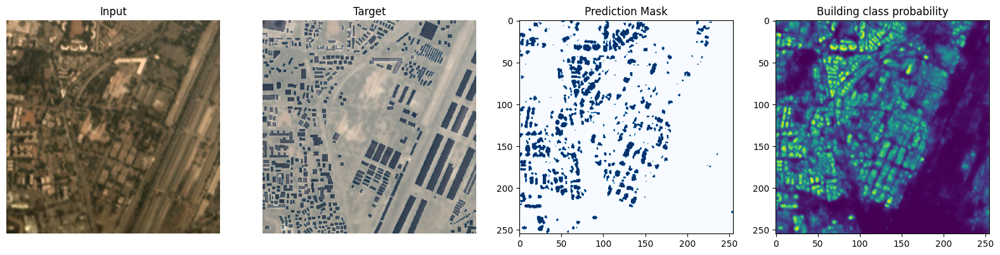

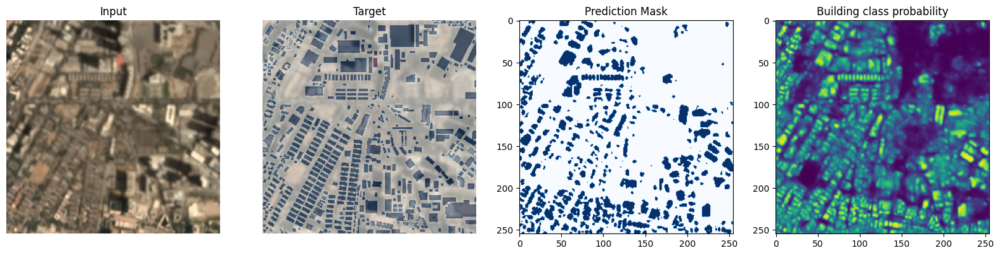

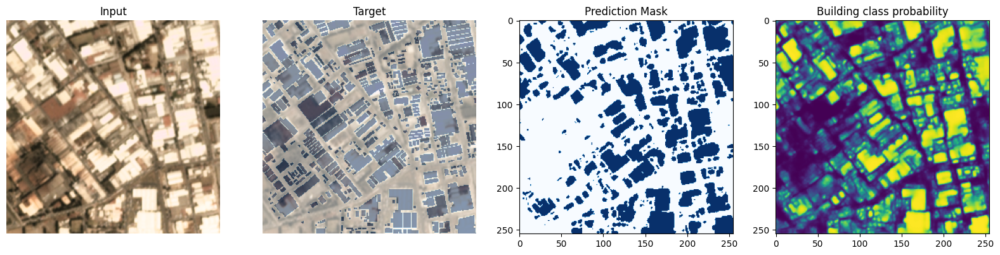

In [ ]:
def show_single_pred(index: int):
    fig, ax = plt.subplots(1, 4, figsize=(20, 5))
    dls.valid_ds[index][0].show(ctx=ax[0])
    ax[0].set_title("Input")
    show_at(dls.valid_ds, index, cmap='Blues', ctx=ax[1])
    ax[1].set_title("Target")
    ax[2].imshow(preds[index].numpy(), cmap='Blues')
    ax[2].set_title("Prediction Mask")
    ax[3].imshow(probs[index][1].numpy(), cmap='viridis')
    ax[3].set_title("Building class probability")

for idx in loss_sorted[:3]:
    print(f'Tile #{idx}, loss: {losses[idx]}')
    show_single_pred(idx)


The analysis of images exhibiting the highest losses reveals a consistent pattern of dense urban areas. It is evident that the model encounters challenges in accurately identifying and segmenting large buildings, as they are frequently overlooked or disregarded. Additionally, it is notable that the model tends to merge very small buildings, resulting in conglomerations or "blobs" of multiple buildings. Consequently, the task of tracking individual buildings within this context is expected to be inherently difficult.

### Plot samples with medium losses

Tile #TensorBase(55), loss: TensorBase(0.0578)
Tile #TensorBase(6), loss: TensorBase(0.0577)
Tile #TensorBase(14), loss: TensorBase(0.0543)


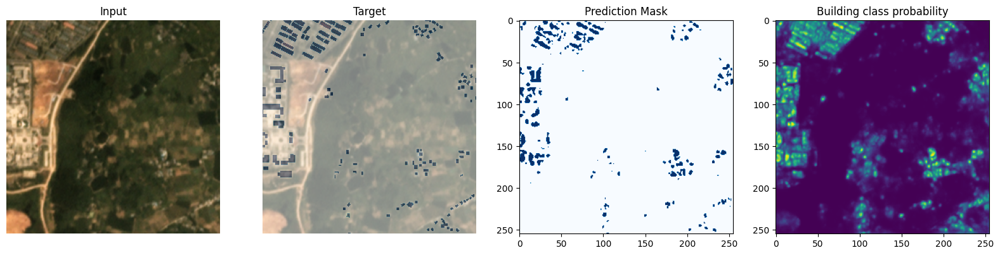

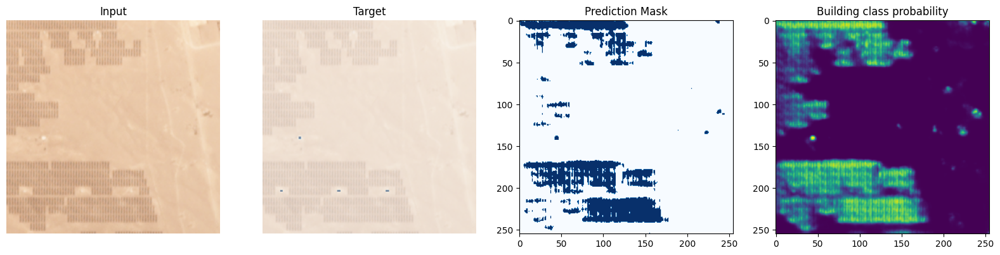

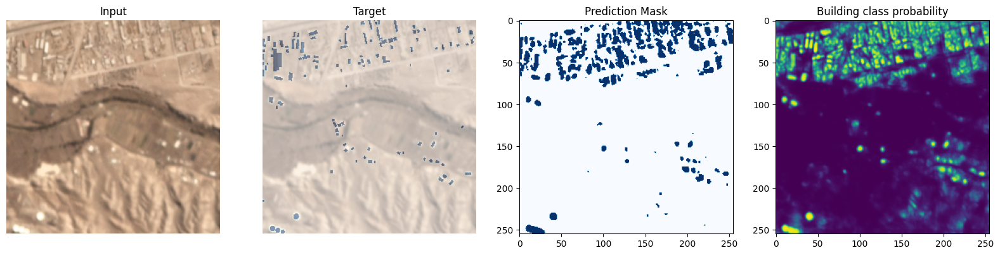

In [ ]:
#collapse
for idx in loss_sorted[n//2-1:n//2+2]:
  print(f'Tile #{idx}, loss: {losses[idx]}')
  show_single_pred(idx)

The model exhibits a tendency to merge small buildings into larger conglomerations, leading to the formation of indistinct blobs. Additionally, there are instances where false positives occur, indicating the misclassification of non-building elements as buildings. However, it is worth noting that amidst these limitations, the model demonstrates noteworthy performance by accurately identifying certain buildings that pose challenges even for human observers.

### Plot some examples with low losses

Tile #TensorBase(121), loss: TensorBase(0.0033)
Tile #TensorBase(7), loss: TensorBase(0.0029)
Tile #TensorBase(81), loss: TensorBase(0.0029)


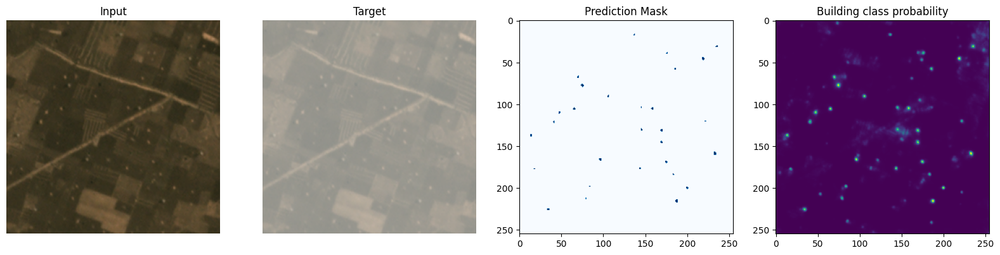

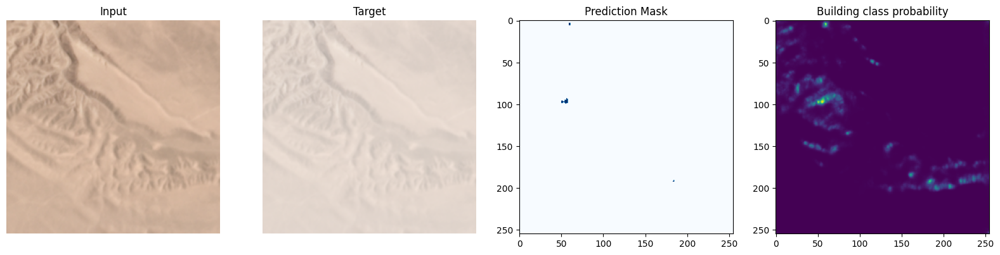

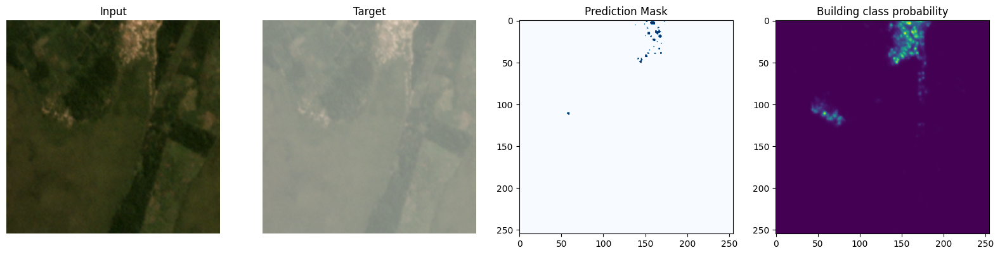

In [ ]:
#collapse
for idx in loss_sorted[-21:-18]:
  print(f'Tile #{idx}, loss: {losses[idx]}')
  show_single_pred(idx)

In images with a sparse distribution of buildings, the model exhibits varied performance. Generally, the accuracy in such cases appears to be comparatively better than in densely populated areas. However, it is important to note that the model still generates false positives, erroneously classifying non-building elements as buildings. Furthermore, certain tiles exhibit peculiar artifacts, particularly in the corners. This suggests that the model may interpret the corners themselves as buildings, particularly on tiles encompassing water areas.

### Show complete scenes

Predict all tiles of a scene:

In [ ]:
#collapse
def save_predictions(scene, path=path) -> None:
  "Predicts all 16 tiles of one scene and saves them to disk"
  output_folder = path/scene/'predicted_tiles'
  if not os.path.exists(output_folder):
    os.makedirs(output_folder)
  tiles = get_image_files(path/scene/'img_tiles').sorted()
  for i in range(16):
    tile_preds = learn.predict(tiles[i])
    to_image(tile_preds[2][1].repeat(3,1,1)).save(output_folder/f'{i:02d}.png')

In [ ]:
scene = VALID_SCENES[0] # 'L15-0571E-1075N_2287_3888_13'

In [ ]:
save_predictions(scene)

Helper function to show several tiles as a large image:

In [ ]:
#collapse
def unblockshaped(arr, h, w):
    """
    Return an array of shape (h, w) where
    h * w = arr.size

    If arr is of shape (n, nrows, ncols), n sublocks of shape (nrows, ncols),
    then the returned array preserves the "physical" layout of the sublocks.

    Source: https://stackoverflow.com/a/16873755
    """
    try: # with color channel
      n, nrows, ncols, c = arr.shape
      return (arr.reshape(h//nrows, -1, nrows, ncols, c)
                .swapaxes(1,2)
                .reshape(h, w, c))
    except ValueError: # without color channel
      n, nrows, ncols = arr.shape
      return (arr.reshape(h//nrows, -1, nrows, ncols)
                .swapaxes(1,2)
                .reshape(h, w))

Load saved predictions:

In [ ]:
#collapse
def get_saved_preds(scene, path=path):
  "Load saved prediction mask tiles for a scene and return image + assembled mask"
  image_file = (path/scene/'images_masked').ls()[0]
  image = load_image(image_file)

  mask_tiles = get_image_files(path/scene/'predicted_tiles').sorted()
  mask_arrs = np.array(list(maps(partial(load_image, mode="L"), np.asarray, mask_tiles)))
  mask_array = unblockshaped(np.array(mask_arrs), 1020, 1020)

  return (image, mask_array)

Show image + stitched predictions:

In [ ]:
#collapse
def show_complete_preds(image, mask_array, scene):
  "Source: https://github.com/CosmiQ/CosmiQ_SN7_Baseline/blob/master/notebooks/sn7_baseline.ipynb"
  figsize = (25, 16)
  fig, (ax0, ax1) = plt.subplots(1, 2, figsize=figsize)
  _ = ax0.imshow(image)
  ax0.set_xticks([])
  ax0.set_yticks([])
  ax0.set_title('Image')
  _ = ax1.imshow(mask_array, cmap='viridis')
  ax1.set_xticks([])
  ax1.set_yticks([])
  ax1.set_title('Prediction Mask')
  plt.suptitle(scene)
  plt.tight_layout()
  plt.savefig(os.path.join(path, scene + '_im0+mask0+dice575.png'))
  plt.show()

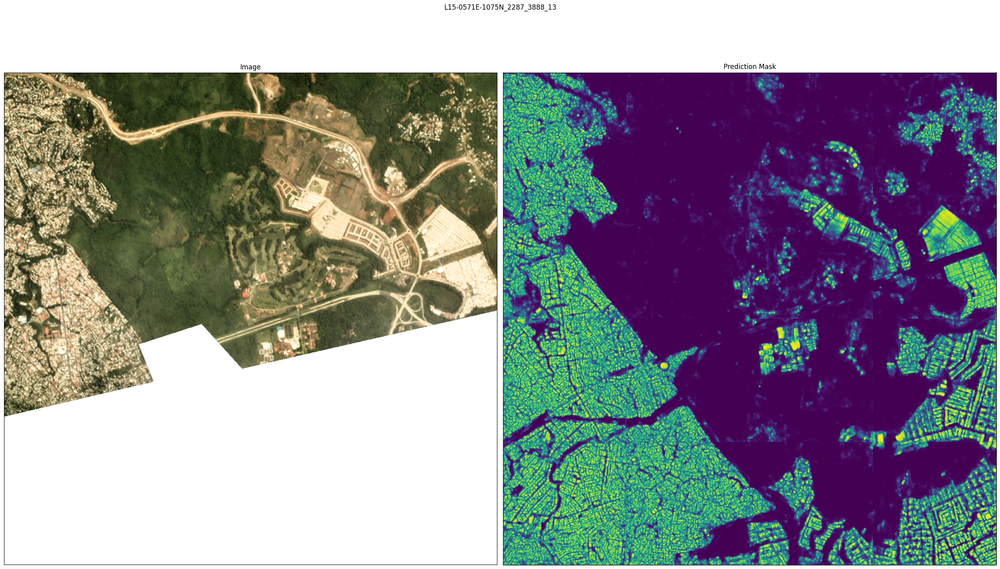

In [ ]:
show_complete_preds(*get_saved_preds(scene), scene)

<img src="https://github.com/JohannesStutz/blog/blob/master/images/articles/2021-spacenet7/fullscene1.jpg?raw=1" />

In [ ]:
# hide
# for scene in VALID_SCENES:
#   save_predictions(scene)
#   show_complete_preds(*get_saved_preds(scene), scene)

### What worked?

* Utilizing a pretrained encoder: The incorporation of a pretrained encoder, specifically a xResNet34 model pretrained on ImageNet, proved to be beneficial. This approach leveraged the learned features from a large-scale dataset, enhancing the model's ability to capture relevant information and improving overall performance.

* Selective utilization of images: Through experimentation, it was observed that focusing on a subset of images per scene, specifically one image instead of five, yielded comparable results without significant improvement. This approach allowed for a reduction in training time without compromising the achieved outcomes.

* Implementation of standard data augmentations: The application of common data augmentations played a crucial role in preventing overfitting. These augmentations introduced variations in the training data, promoting generalization and enhancing the model's ability to handle diverse and previously unseen images.

* Employment of weighted cross-entropy loss: By incorporating weights into the cross-entropy loss function, the model's performance improved notably. The introduction of weights mitigated the strong bias towards the predominant background class, enabling the model to better recognize and classify buildings, thereby addressing the imbalanced nature of the dataset.

* Additionally, although undersampling had a modest impact, it facilitated a slight improvement in training efficiency and contributed to enhanced accuracy.

* Overall, these strategies and techniques demonstrated their effectiveness in improving the model's performance and addressing specific challenges encountered in the image segmentation task.

Additionally, although undersampling had a modest impact, it facilitated a slight improvement in training efficiency and contributed to enhanced accuracy.

Overall, these strategies and techniques demonstrated their effectiveness in improving the model's performance and addressing specific challenges encountered in the image segmentation task.

### What did not work

* Implementation of the Mish activation function: Despite the expectation of faster training, the utilization of the Mish activation function did not yield the desired outcome. Instead, it resulted in unstable training dynamics, potentially indicating that this activation function was not well-suited for the specific image segmentation task at hand.

* Adoption of Dice loss: The substitution of the cross-entropy loss with the Dice loss proved to be unstable as well. This alternative loss function, aimed at enhancing performance for imbalanced datasets, did not yield the expected improvements and may have introduced training instabilities.

* Integration of self-attention in the U-Net: The incorporation of self-attention mechanisms within the U-Net architecture was anticipated to facilitate the accurate classification of larger structures. However, no significant improvement was observed, suggesting that the self-attention module did not offer substantial advantages in this particular context.

* Utilization of a deeper xResNet50 encoder: Despite the increased depth and complexity of the xResNet50 encoder, this modification failed to produce improved results. Training time was substantially prolonged, with a six-fold increase, without corresponding enhancements in model performance. This suggests that the additional computational resources and complexity did not yield significant benefits for the specific image segmentation task.

Overall, these attempted approaches did not deliver the anticipated enhancements and may require further investigation or adjustments to better align with the requirements and characteristics of the dataset and segmentation task.

## Conclusion


Evaluating the results presents a challenge as there is no direct basis for comparison. Although a Dice score of 0.57 may not appear particularly impressive, it is important to consider the inherent difficulties posed by the dataset and the fact that the architecture was not customized extensively. Given these factors, we find the achieved result to be relatively satisfactory.

Regarding the aspects that yielded positive outcomes, the employed approach successfully tackled the semantic segmentation task by classifying pixels as building or non-building. The model demonstrated an ability to identify buildings that even posed challenges for human perception. This suggests that the initial segmentation framework was effective in capturing relevant features within the images.

Moving forward, we aspire to explore and enhance the capability of recognizing individual buildings and tracking them over time, as required in the original SpaceNet7 challenge. This represents an exciting avenue for future development and improvement in the field of building detection and tracking within satellite imagery analysis.

In the future, to further enhance the results, several strategies can be explored. Firstly, data processing techniques such as utilizing overlapping tiles and scaling up image tiles can be employed to capture finer details and context. Secondly, implementing dynamic thresholding methods can adaptively convert predicted probabilities into a binary mask, facilitating improved differentiation between building and non-building regions. Additionally, exploring recent advancements in segmentation models, such as UNet with ASPP or Eff-UNet, can leverage advanced architectural features to enhance feature representation. Allocating more computational resources to train deeper models can also allow for the capture of complex patterns and representations. Furthermore, employing cross-validation with multiple folds can effectively utilize the entire dataset and enhance generalization. Lastly, ensemble learning, which combines predictions from multiple models, can mitigate biases and boost overall segmentation accuracy. 

These strategies offer promising avenues for future research and development, aimed at addressing limitations and achieving further improvements in the accuracy and robustness of the segmentation results.
